# Seismic Detection Model - Lunar

**1. Setup**

In [1]:
# Import libraries
import numpy as np
import pandas as pd
from obspy import read
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import os
from obspy import read
import seaborn as sns
from scipy.fftpack import fft
from scipy import signal
from datetime import datetime, timedelta
from obspy.core import UTCDateTime
import pyarrow.parquet as pq
from obspy.signal.trigger import classic_sta_lta, trigger_onset
from sklearn.model_selection import ParameterGrid
import random
import pyarrow as pa
import pyarrow.parquet as pq
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV
from imblearn.over_sampling import SMOTE
import joblib
import pickle

**2. Data exploration**

In [2]:
# Load the catalog
catalog_directory = './space_apps_2024_seismic_detection/data/lunar/training/catalogs/'
catalog_file = catalog_directory + 'apollo12_catalog_GradeA_final.csv'
data_catalog_lunar = pd.read_csv(catalog_file)

# Display the first few rows of the catalog
print(data_catalog_lunar)

                                  Filename time_abs(%Y-%m-%dT%H:%M:%S.%f)  \
0   xa.s12.00.mhz.1970-01-19HR00_evid00002     1970-01-19T20:25:00.000000   
1   xa.s12.00.mhz.1970-03-25HR00_evid00003     1970-03-25T03:32:00.000000   
2   xa.s12.00.mhz.1970-03-26HR00_evid00004     1970-03-26T20:17:00.000000   
3   xa.s12.00.mhz.1970-04-25HR00_evid00006     1970-04-25T01:14:00.000000   
4   xa.s12.00.mhz.1970-04-26HR00_evid00007     1970-04-26T14:29:00.000000   
..                                     ...                            ...   
71  xa.s12.00.mhz.1974-10-14HR00_evid00156     1974-10-14T17:43:00.000000   
72  xa.s12.00.mhz.1975-04-12HR00_evid00191     1975-04-12T18:15:00.000000   
73  xa.s12.00.mhz.1975-05-04HR00_evid00192     1975-05-04T10:05:00.000000   
74  xa.s12.00.mhz.1975-06-24HR00_evid00196     1975-06-24T16:03:00.000000   
75  xa.s12.00.mhz.1975-06-26HR00_evid00198     1975-06-26T03:24:00.000000   

    time_rel(sec)       evid    mq_type  
0         73500.0  evid00002  imp

In [3]:
data_catalog_lunar = data_catalog_lunar.rename(columns={'Filename': 'filename'})
print("Renamed 'Filename' to 'filename' in features dataframe")
data_catalog_lunar.to_csv(catalog_file, index=False)

Renamed 'Filename' to 'filename' in features dataframe


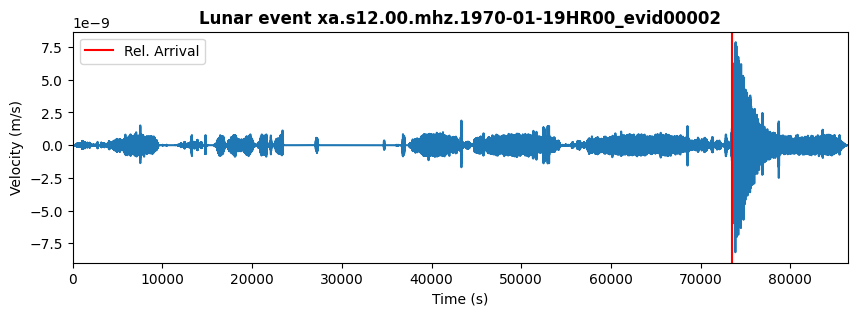

In [4]:
# Plot the first seismic event in the catalog and let's take a look at the relative time when it starts
row = data_catalog_lunar.iloc[0]
arrival_time_rel = row['time_rel(sec)']

# Let's also get the name of the file
test_filename = row.filename

# Read the CSV file corresponding to that detection
data_directory = './space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA/'
csv_file = f'{data_directory}{test_filename}.csv'
data_cat = pd.read_csv(csv_file)
data_cat

# Read in time steps and velocities
csv_times = np.array(data_cat['time_rel(sec)'].tolist())
csv_data = np.array(data_cat['velocity(m/s)'].tolist())

# Plot the trace! 
fig,ax = plt.subplots(1,1,figsize=(10,3))
ax.plot(csv_times,csv_data)

# Make the plot pretty
ax.set_xlim([min(csv_times),max(csv_times)])
ax.set_ylabel('Velocity (m/s)')
ax.set_xlabel('Time (s)')
ax.set_title(f'Lunar event {test_filename}', fontweight='bold')

# Plot where the arrival time is
arrival_line = ax.axvline(x=arrival_time_rel, c='red', label='Rel. Arrival')
ax.legend(handles=[arrival_line])

In [5]:
# Define the data directory and list all MiniSEED files
data_directory = './space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA/'
mseed_files = [f for f in os.listdir(data_directory) if f.endswith('.mseed')]

# Read the first MiniSEED file to inspect its metadata
st = read(os.path.join(data_directory, mseed_files[0]))

# Print metadata for each trace in the file
for tr in st:
    print(tr.stats)

         network: XA
         station: S12
        location: 00
         channel: MHZ
       starttime: 1973-07-29T00:00:00.262000Z
         endtime: 1973-07-29T23:59:59.356340Z
   sampling_rate: 6.625
           delta: 0.1509433962264151
            npts: 572395
           calib: 1.0
         _format: MSEED
           mseed: AttribDict({'dataquality': 'D', 'number_of_records': 1136, 'encoding': 'FLOAT64', 'byteorder': '>', 'record_length': 4096, 'filesize': 4653056})


File 1: xa.s12.00.mhz.1973-07-29HR00_evid00121.mseed
Start Time: 1973-07-29T00:00:00.262000Z, End Time: 1973-07-29T23:59:59.356340Z
Sampling Rate: 6.625
Number of Points: 572395
----------------------------------------
File 2: xa.s12.00.mhz.1973-06-05HR00_evid00108.mseed
Start Time: 1973-06-05T00:00:00.300000Z, End Time: 1973-06-05T23:59:59.394340Z
Sampling Rate: 6.625
Number of Points: 572395
----------------------------------------
File 3: xa.s12.00.mhz.1971-11-14HR00_evid00046.mseed
Start Time: 1971-11-14T00:00:00.602000Z, End Time: 1971-11-15T00:00:00.300113Z
Sampling Rate: 6.625
Number of Points: 572399
----------------------------------------
File 4: xa.s12.00.mhz.1974-04-27HR00_evid00145.mseed
Start Time: 1974-04-27T00:00:00.646000Z, End Time: 1974-04-27T23:59:57.929019Z
Sampling Rate: 6.625
Number of Points: 572383
----------------------------------------
File 5: xa.s12.00.mhz.1971-05-13HR00_evid00033.mseed
Start Time: 1971-05-13T00:00:00.183000Z, End Time: 1971-05-14T00:00:01.

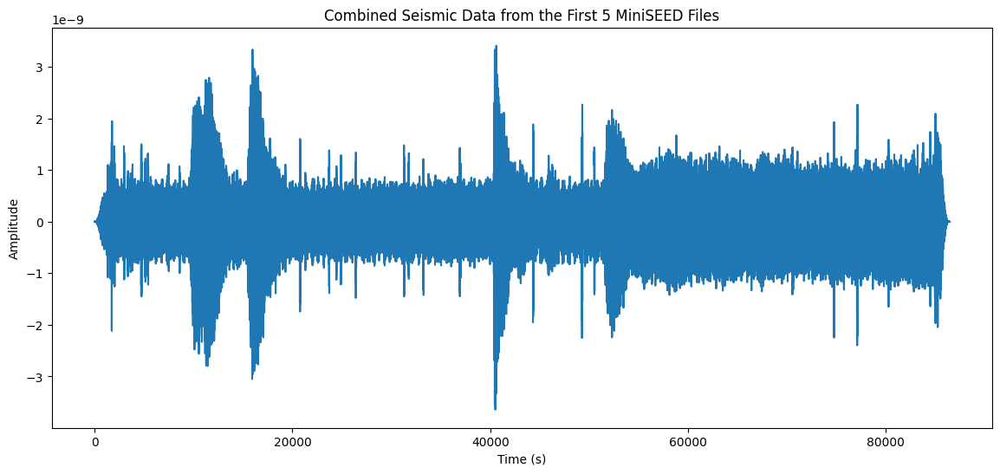

In [6]:
# Extract 5 instances from MSSED files and plot them

# Define the data directory
data_directory = 'space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA'

# Get the list of all MiniSEED files in the directory
mseed_files = [f for f in os.listdir(data_directory) if f.endswith('.mseed')]

# Read and plot the first 5 files
if len(mseed_files) < 5:
    print("Not enough files to display.")
else:
    # Initialize lists to combine data from the files
    times_combined = []
    data_combined_mseed = []

    for i in range(5):
        # Load the MiniSEED file
        st = read(os.path.join(data_directory, mseed_files[i]))
        
        # Extract the first trace from each file
        tr = st[0]
        
        # Append the time and data from each trace
        times_combined.append(tr.times())  # Time array
        data_combined_mseed.append(tr.data)  # Amplitude array
        
        # Print some basic info from the trace
        print(f"File {i+1}: {mseed_files[i]}")
        print(f"Start Time: {tr.stats.starttime}, End Time: {tr.stats.endtime}")
        print(f"Sampling Rate: {tr.stats.sampling_rate}")
        print(f"Number of Points: {tr.stats.npts}")
        print("-" * 40)

    # Concatenate the time and data arrays for plotting
    times_combined = np.concatenate(times_combined)
    data_combined_mseed = np.concatenate(data_combined_mseed)

    # Plot the combined data from the first 5 files
    plt.figure(figsize=(14, 6))
    plt.plot(times_combined, data_combined_mseed)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.title('Combined Seismic Data from the First 5 MiniSEED Files')
    plt.show()

In [7]:
# Define the data directory
data_directory = 'space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA'

# Get the list of all MiniSEED files in the directory
mseed_files = [f for f in os.listdir(data_directory) if f.endswith('.mseed')]

# Read the first file to inspect
st = read(os.path.join(data_directory, mseed_files[0]))

# Loop through each trace in the MiniSEED file
for i, tr in enumerate(st):
    print(f"Instance {i+1}:")
    
    # Print metadata information
    print(f"  Start Time: {tr.stats.starttime}")
    print(f"  Sampling Rate: {tr.stats.sampling_rate}")
    
    # Check the amplitude data (this should be an array of values for each instance)
    amplitude_data = tr.data
    print(f"  Amplitude (First 10 values): {amplitude_data[:10]}")  # Print first 10 values as a preview
    print(f"  Total Number of Amplitude Values: {len(amplitude_data)}")
    print("-" * 50)

    # Optionally, stop after inspecting the first few instances
    if i >= 4:  # Change this number to check more or fewer instances
        break

Instance 1:
  Start Time: 1973-07-29T00:00:00.262000Z
  Sampling Rate: 6.625
  Amplitude (First 10 values): [-1.14592108e-15 -1.41870904e-15 -1.53586041e-15 -1.47790468e-15
 -1.30021162e-15 -1.08540260e-15 -8.89640028e-16 -7.19619877e-16
 -5.49098111e-16 -3.54407081e-16]
  Total Number of Amplitude Values: 572395
--------------------------------------------------


In [8]:
# Define the data directory
data_directory = 'space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA'

# Get the list of all MiniSEED files in the directory
mseed_files = [f for f in os.listdir(data_directory) if f.endswith('.mseed')]

# Initialize a counter for total instances
total_instances = 0

# Loop through each MiniSEED file
for mseed_file in mseed_files:
    # Read the MiniSEED file
    st = read(os.path.join(data_directory, mseed_file))
    
    # Add the number of traces in this file to the total instances
    total_instances += len(st)

# Print the total number of instances across all MiniSEED files
print(f'Total number of instances (traces) across all MiniSEED files: {total_instances}')

Total number of instances (traces) across all MiniSEED files: 76


**3. Feature Extraction**

In [9]:
# Extract features from MSEED files and save it in parquet format(df_features_lunar.parquet) to facilitate the analysis with ML

# Define the data directory
data_directory = 'space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA'

# Get the list of all MiniSEED files in the directory
mseed_files = [f for f in os.listdir(data_directory) if f.endswith('.mseed')]

# Prepare empty lists to hold feature data
amplitudes = []
relative_times = []
filenames = []

# Initialize an ID counter
instance_id = 0

# Loop through each MiniSEED file
for mseed_file in mseed_files:
    st = read(os.path.join(data_directory, mseed_file))
    
    for tr in st:
        # Extract necessary information
        amplitude_data = tr.data
        start_time = tr.stats.starttime
        sampling_rate = tr.stats.sampling_rate
        
        # Calculate features
        delta = 1 / sampling_rate  # Delta (time difference) from sampling rate
        
        # Store features in respective lists
        amplitudes.append(amplitude_data.tolist())
        relative_times.append(np.arange(len(amplitude_data)) * delta)
        filenames.append(mseed_file)
        
        # Add ID for each instance
        instance_id += 1

# Create a DataFrame from the collected data
df_features = pd.DataFrame({
    'ID': np.arange(1, instance_id + 1),
    'Amplitude': amplitudes,
    'Relative Time': relative_times,
    'Filename': filenames
})

# Save DataFrame to Parquet
df_features.to_parquet('df_lunar.parquet', index=False)

In [10]:
# # Read features
df_features_extracted = pd.read_parquet('df_lunar.parquet')
df_features_extracted.head()

,ID,Amplitude,Relative Time,Filename
0,1,"[-1.145921082898968e-15, -1.4187090358419494e-...","[0.0, 0.1509433962264151, 0.3018867924528302, ...",xa.s12.00.mhz.1973-07-29HR00_evid00121.mseed
1,2,"[-3.8245369385730925e-16, -4.935499766066096e-...","[0.0, 0.1509433962264151, 0.3018867924528302, ...",xa.s12.00.mhz.1973-06-05HR00_evid00108.mseed
2,3,"[1.406432122600214e-15, 1.6855208033984058e-15...","[0.0, 0.1509433962264151, 0.3018867924528302, ...",xa.s12.00.mhz.1971-11-14HR00_evid00046.mseed
3,4,"[1.0874829077597559e-15, 9.658969827252803e-16...","[0.0, 0.1509433962264151, 0.3018867924528302, ...",xa.s12.00.mhz.1974-04-27HR00_evid00145.mseed
4,5,"[-7.861305307766885e-16, -1.0024571600031247e-...","[0.0, 0.1509433962264151, 0.3018867924528302, ...",xa.s12.00.mhz.1971-05-13HR00_evid00033.mseed


In [11]:
# Check the number of instances (rows)in the features dataset
num_instances = df_features_extracted.shape[0]
print(f'Number of instances: {num_instances}')

Number of instances: 76


In [12]:
# Rename the 'filename' column to 'Filename' if it exists
if 'filename' in data_catalog_lunar.columns:
    data_catalog_lunar = data_catalog_lunar.rename(columns={'filename': 'Filename'})
    print("Renamed 'filename' to 'Filename' in CSV")

# Save the updated CSV file
data_catalog_lunar.to_csv(catalog_file, index=False)
print(f"Updated CSV saved with 'Filename' column: {catalog_file}")


# Print column names to verify
print("Features file columns:", df_features_extracted.columns)
print("Updated labels file columns:", data_catalog_lunar.columns)

Renamed 'filename' to 'Filename' in CSV
Updated CSV saved with 'Filename' column: ./space_apps_2024_seismic_detection/data/lunar/training/catalogs/apollo12_catalog_GradeA_final.csv
Features file columns: Index(['ID', 'Amplitude', 'Relative Time', 'Filename'], dtype='object')
Updated labels file columns: Index(['Filename', 'time_abs(%Y-%m-%dT%H:%M:%S.%f)', 'time_rel(sec)', 'evid',
       'mq_type'],
      dtype='object')


In [13]:
# Merge features and labels datasets

# Remove '.mseed' from the 'Filename' column in the features DataFrame
df_features_extracted['Filename'] = df_features_extracted['Filename'].str.replace('.mseed', '', regex=False)

# Now perform the merge
df_combined = pd.merge(df_features_extracted, data_catalog_lunar, on='Filename', how='inner')

# Select the columns to keep
columns_to_keep = df_features_extracted.columns.tolist() + ['time_rel(sec)', 'mq_type']
df_lunar_features_labels = df_combined[columns_to_keep]

# Save the combined DataFrame to Parquet
df_lunar_features_labels.to_parquet('df_lunar.parquet')

In [14]:
# Reading dataset after merging datasets(features-labels)
df_features_labels = pd.read_parquet('df_lunar.parquet')
df_features_labels.head()

,ID,Amplitude,Relative Time,Filename,time_rel(sec),mq_type
0,1,"[-1.145921082898968e-15, -1.4187090358419494e-...","[0.0, 0.1509433962264151, 0.3018867924528302, ...",xa.s12.00.mhz.1973-07-29HR00_evid00121,84660.0,impact_mq
1,2,"[-3.8245369385730925e-16, -4.935499766066096e-...","[0.0, 0.1509433962264151, 0.3018867924528302, ...",xa.s12.00.mhz.1973-06-05HR00_evid00108,40200.0,deep_mq
2,3,"[1.406432122600214e-15, 1.6855208033984058e-15...","[0.0, 0.1509433962264151, 0.3018867924528302, ...",xa.s12.00.mhz.1971-11-14HR00_evid00046,15420.0,impact_mq
3,4,"[1.0874829077597559e-15, 9.658969827252803e-16...","[0.0, 0.1509433962264151, 0.3018867924528302, ...",xa.s12.00.mhz.1974-04-27HR00_evid00145,51480.0,impact_mq
4,5,"[-7.861305307766885e-16, -1.0024571600031247e-...","[0.0, 0.1509433962264151, 0.3018867924528302, ...",xa.s12.00.mhz.1971-05-13HR00_evid00033,10800.0,impact_mq


**4. STA/LTA Model Analysis**

In [15]:
# Define the data directory
data_directory = 'space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA'

In [16]:
# 1. Extract Amplitude Values: Create a function to extract the amplitude value at the event start time for each instance.
def get_amplitude_at_event_start(amplitude_data, sampling_rate, time_rel_sec):
    event_index = int(time_rel_sec * sampling_rate)
    return amplitude_data[event_index]

# Collect amplitude values at event start
amplitude_values_at_event_start = []
for index, row in df_features_labels.iterrows():
    amplitude_data = np.array(row['Amplitude'])
    time_rel_sec = row['time_rel(sec)']
    amplitude_at_start = get_amplitude_at_event_start(amplitude_data, sampling_rate, time_rel_sec)
    amplitude_values_at_event_start.append(amplitude_at_start)

# Convert to a numpy array for easier manipulation
amplitude_values_at_event_start = np.array(amplitude_values_at_event_start)

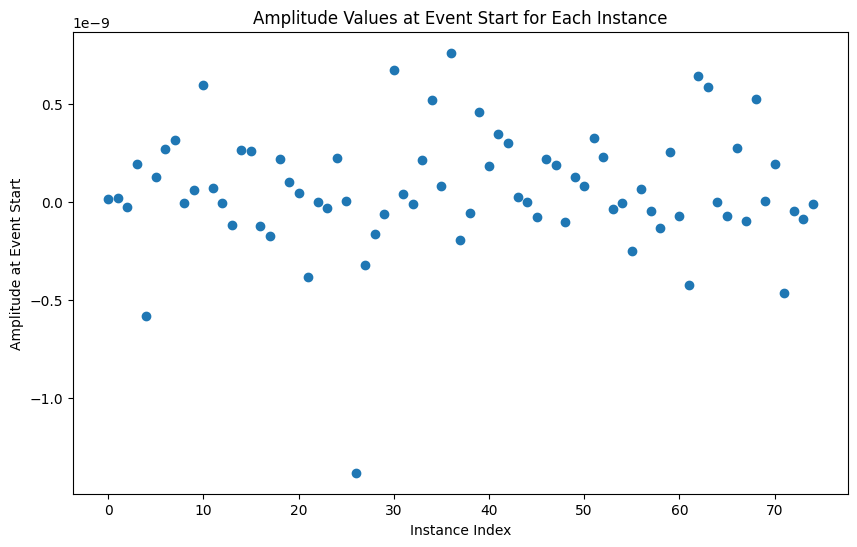

In [17]:
# 2. Plot the amplitude values at event start
plt.figure(figsize=(10, 6))
plt.plot(amplitude_values_at_event_start, 'o')
plt.xlabel('Instance Index')
plt.ylabel('Amplitude at Event Start')
plt.title('Amplitude Values at Event Start for Each Instance')
plt.show()

In [18]:
#  3. Use the minimal value from these plots to set the thr_on parameter.

# Find the minimal amplitude value to set thr_on
min_amplitude = np.min(amplitude_values_at_event_start)
print(f"Minimal amplitude at event start: {min_amplitude}")

# Set thr_on based on the minimal amplitude
thr_on = min_amplitude
print(f"thr_on set to: {thr_on}")

Minimal amplitude at event start: -1.3831699157216924e-09
thr_on set to: -1.3831699157216924e-09


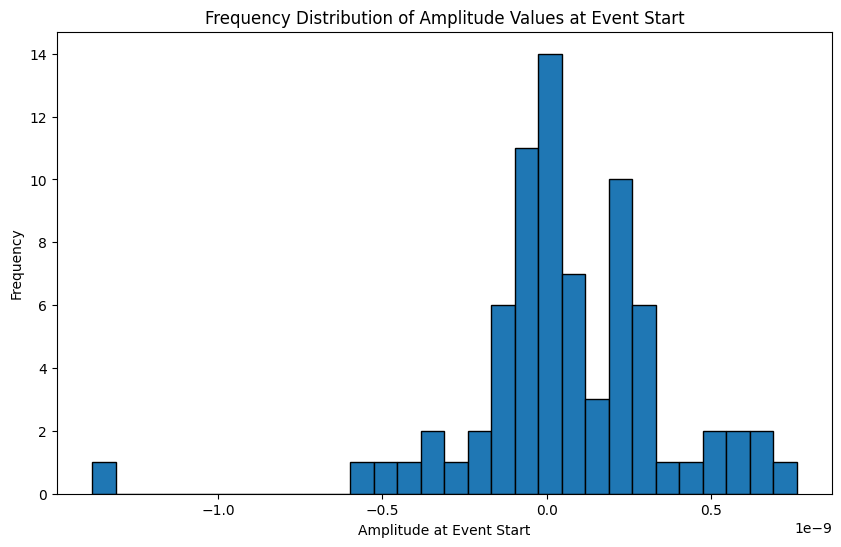

In [19]:
# Use the frequency distribution to determine a threshold that captures more than 90% of the events.
def get_amplitude_at_event_start(amplitude_data, sampling_rate, time_rel_sec):
    event_index = int(time_rel_sec * sampling_rate)
    return amplitude_data[event_index]

# Collect amplitude values at event start
amplitude_values_at_event_start = []
for index, row in df_features_labels.iterrows():
    amplitude_data = np.array(row['Amplitude'])
    time_rel_sec = row['time_rel(sec)']
    amplitude_at_start = get_amplitude_at_event_start(amplitude_data, sampling_rate, time_rel_sec)
    amplitude_values_at_event_start.append(amplitude_at_start)

# Convert to a numpy array for easier manipulation
amplitude_values_at_event_start = np.array(amplitude_values_at_event_start)

# Plot the histogram of amplitude values
plt.figure(figsize=(10, 6))
plt.hist(amplitude_values_at_event_start, bins=30, edgecolor='black')
plt.xlabel('Amplitude at Event Start')
plt.ylabel('Frequency')
plt.title('Frequency Distribution of Amplitude Values at Event Start')
plt.show()

In [20]:
# Calculate the 90th percentile of the amplitude values
thr_on_90th_percentile = np.percentile(amplitude_values_at_event_start, 95)
print(f"thr_on set to the 90th percentile: {thr_on_90th_percentile}")

# Set thr_on based on the 90th percentile
thr_on = thr_on_90th_percentile
print(f"thr_on set to: {thr_on}")

thr_on set to the 90th percentile: 5.868276591076287e-10
thr_on set to: 5.868276591076287e-10


In [21]:
# Find optimal parameter thr_off by analyzing amplitude values regarding time_rel(sec)-end

# Load the CSV File
df_start_end_events = pd.read_csv('apollo12_catalog_GradeA_startEnd.csv')

# Display the first few rows to verify the data
print(df_start_end_events.head())

                                 Filename time_abs(%Y-%m-%dT%H:%M:%S.%f)  \
0  xa.s12.00.mhz.1970-01-19HR00_evid00002     1970-01-19T20:25:00.000000   
1  xa.s12.00.mhz.1970-03-25HR00_evid00003     1970-03-25T03:32:00.000000   
2  xa.s12.00.mhz.1970-03-26HR00_evid00004     1970-03-26T20:17:00.000000   
3  xa.s12.00.mhz.1970-04-25HR00_evid00006     1970-04-25T01:14:00.000000   
4  xa.s12.00.mhz.1970-04-26HR00_evid00007     1970-04-26T14:29:00.000000   

   time_rel(sec)-start  time_rel(sec)-end  Duration    mq_type  
0                73500              78491      4991  impact_mq  
1                12720              18113      5393  impact_mq  
2                73020              78491      5471  impact_mq  
3                 4440              10566      6126  impact_mq  
4                52140              57358      5218    deep_mq  


In [22]:
# Add the time_rel(sec)-end and Duration features to df_lunar.parquet dataset:

# Perform the merge
df_combined = pd.merge(df_features_labels, df_start_end_events, on='Filename', how='inner')

# Verify the columns in the combined DataFrame
print(df_combined.columns)


Index(['ID', 'Amplitude', 'Relative Time', 'Filename', 'time_rel(sec)',
       'mq_type_x', 'time_abs(%Y-%m-%dT%H:%M:%S.%f)', 'time_rel(sec)-start',
       'time_rel(sec)-end', 'Duration', 'mq_type_y'],
      dtype='object')


In [23]:
# Select the columns to keep, ensuring they exist in df_combined
columns_to_keep = df_features_labels.columns.tolist() + ['time_rel(sec)-end', 'Duration']
columns_to_keep = [col for col in columns_to_keep if col in df_combined.columns]

# Create the final DataFrame with the selected columns
df_lunar_features_labels = df_combined[columns_to_keep]

# Save the combined DataFrame to Parquet
df_lunar_features_labels.to_parquet('df_lunar.parquet')

In [24]:
# Display the first few rows of the final DataFrame
df_lunar_features_labels.head()

,ID,Amplitude,Relative Time,Filename,time_rel(sec),time_rel(sec)-end,Duration
0,1,"[-1.145921082898968e-15, -1.4187090358419494e-...","[0.0, 0.1509433962264151, 0.3018867924528302, ...",xa.s12.00.mhz.1973-07-29HR00_evid00121,84660.0,86038,1378
1,2,"[-3.8245369385730925e-16, -4.935499766066096e-...","[0.0, 0.1509433962264151, 0.3018867924528302, ...",xa.s12.00.mhz.1973-06-05HR00_evid00108,40200.0,45283,5083
2,3,"[1.406432122600214e-15, 1.6855208033984058e-15...","[0.0, 0.1509433962264151, 0.3018867924528302, ...",xa.s12.00.mhz.1971-11-14HR00_evid00046,15420.0,19623,4203
3,4,"[1.0874829077597559e-15, 9.658969827252803e-16...","[0.0, 0.1509433962264151, 0.3018867924528302, ...",xa.s12.00.mhz.1974-04-27HR00_evid00145,51480.0,55849,4369
4,5,"[-7.861305307766885e-16, -1.0024571600031247e-...","[0.0, 0.1509433962264151, 0.3018867924528302, ...",xa.s12.00.mhz.1971-05-13HR00_evid00033,10800.0,15094,4294


In [25]:
# Load the Parquet File again after updated the dataset with new two features(time_rel(sec)-end and Duration)
df_features_labels = pd.read_parquet('df_lunar.parquet')

In [26]:
# Determine the Optimal thr_off Parameter: 

# 1. Extract Amplitude Values at Event End
def get_amplitude_at_event_end(amplitude_data, sampling_rate, time_rel_sec_end):
    event_end_index = int(time_rel_sec_end * sampling_rate)
    return amplitude_data[event_end_index]

# Collect amplitude values at event end
amplitude_values_at_event_end = []
for index, row in df_features_labels.iterrows():
    amplitude_data = np.array(row['Amplitude'])  # Replace with actual amplitude data loading
    time_rel_sec_end = row['time_rel(sec)-end']
    amplitude_at_end = get_amplitude_at_event_end(amplitude_data, sampling_rate, time_rel_sec_end)
    amplitude_values_at_event_end.append(amplitude_at_end)

# Convert to a numpy array for easier manipulation
amplitude_values_at_event_end = np.array(amplitude_values_at_event_end)

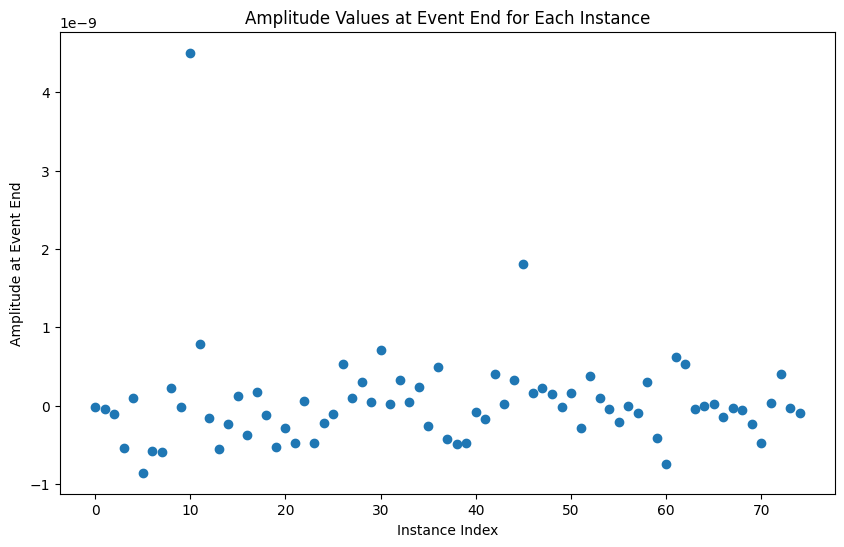

In [27]:
# 2. Plot the amplitude values at event end
plt.figure(figsize=(10, 6))
plt.plot(amplitude_values_at_event_end, 'o')
plt.xlabel('Instance Index')
plt.ylabel('Amplitude at Event End')
plt.title('Amplitude Values at Event End for Each Instance')
plt.show()

In [28]:
# 3. Use the minimal value or a percentile to set the thr_off parameter
min_amplitude_end = np.min(amplitude_values_at_event_end)
print(f"Minimal amplitude at event end: {min_amplitude_end}")

# Set thr_off based on the minimal amplitude
thr_off = min_amplitude_end
print(f"thr_off set to: {thr_off}")

Minimal amplitude at event end: -8.563287597001609e-10
thr_off set to: -8.563287597001609e-10


In [29]:
# Alternatively, use the 90th percentile
thr_off_90th_percentile = np.percentile(amplitude_values_at_event_end, 95)
print(f"thr_off set to the 90th percentile: {thr_off_90th_percentile}")

# Set thr_off based on the 90th percentile
thr_off = thr_off_90th_percentile
print(f"thr_off set to: {thr_off}")

thr_off set to the 90th percentile: 6.45163988597279e-10
thr_off set to: 6.45163988597279e-10


**5. STA/LTA Model Implementationas as a Function**

In [31]:
# 2. Function to Calculate STA/LTA Characteristic Function:
def calculate_sta_lta(amplitude_data, sampling_rate, sta_len, lta_len):
    """
    Calculate the STA/LTA characteristic function.
    
    Parameters:
    - amplitude_data: Array of amplitude data.
    - sampling_rate: Sampling rate of the data.
    - sta_len: Length of the short-term average window in seconds.
    - lta_len: Length of the long-term average window in seconds.
    
    Returns:
    - cft: Characteristic function (STA/LTA ratio).
    """
    sta_samples = int(sta_len * sampling_rate)
    lta_samples = int(lta_len * sampling_rate)
    
    # Calculate STA and LTA
    sta = np.cumsum(amplitude_data ** 2)
    sta = np.insert(sta, 0, 0)
    sta = (sta[sta_samples:] - sta[:-sta_samples]) / sta_samples
    
    lta = np.cumsum(amplitude_data ** 2)
    lta = np.insert(lta, 0, 0)
    lta = (lta[lta_samples:] - lta[:-lta_samples]) / lta_samples
    
    # Ensure the lengths match for division
    min_len = min(len(sta), len(lta))
    sta = sta[:min_len]
    lta = lta[:min_len]
    
    # Avoid division by zero
    lta[lta == 0] = np.nan
    cft = sta / lta
    cft = np.nan_to_num(cft) 
    
    return cft

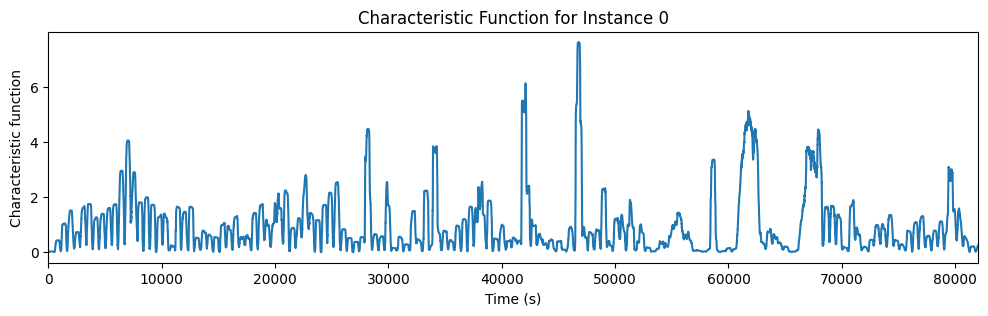

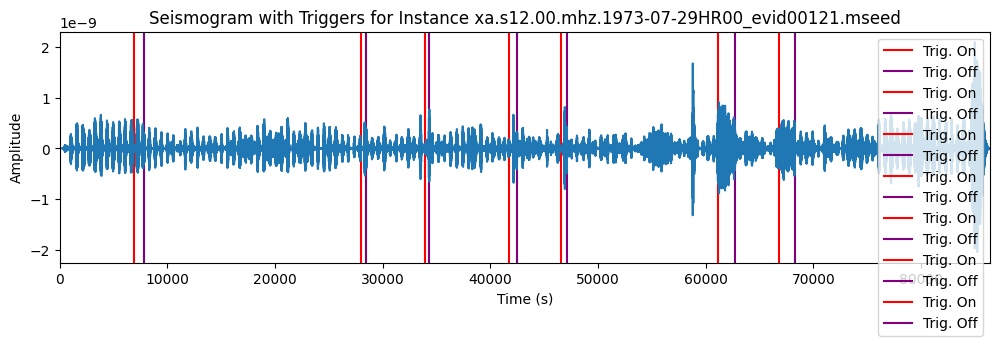

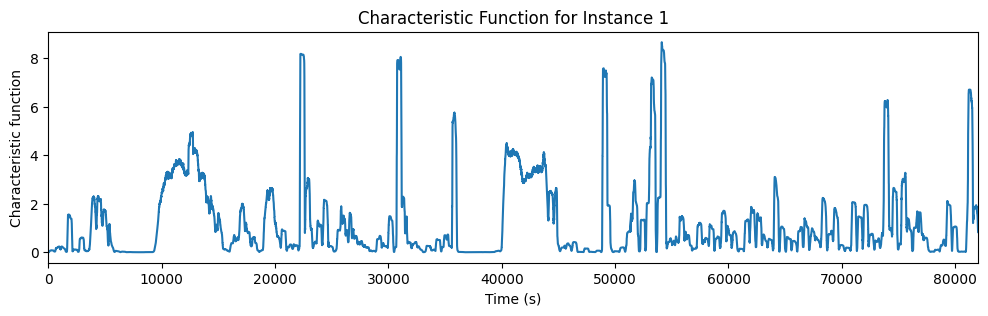

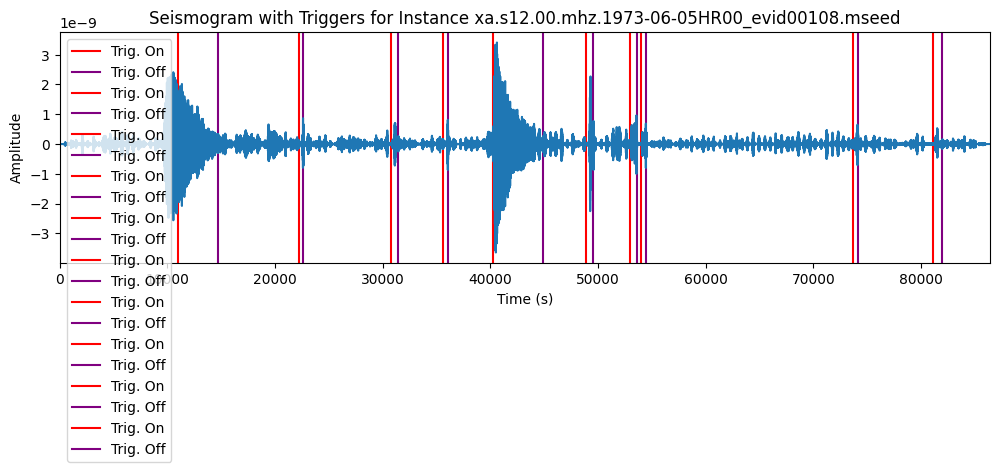

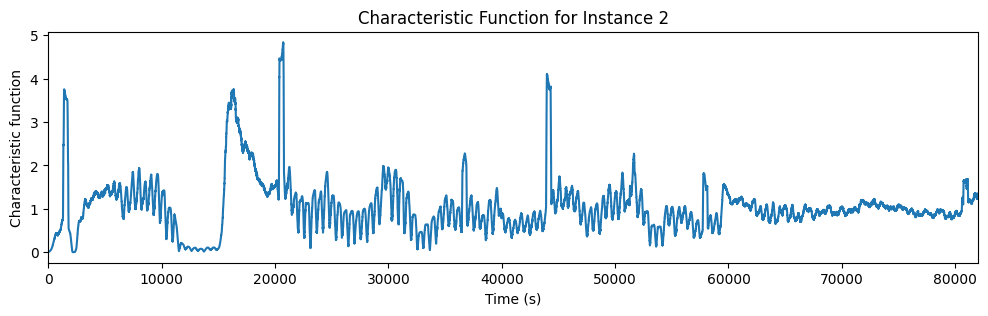

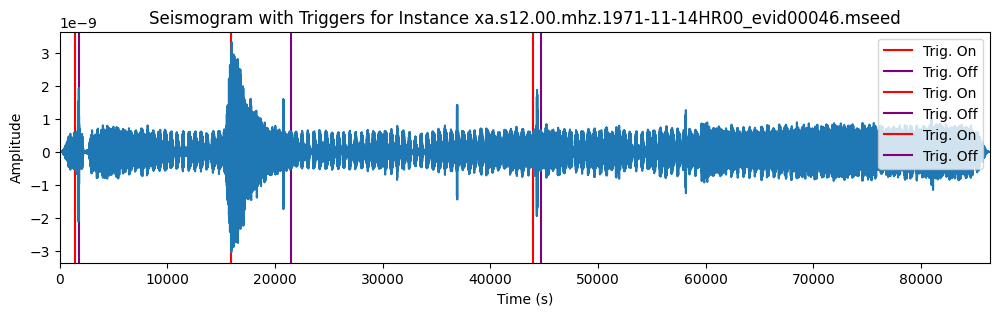

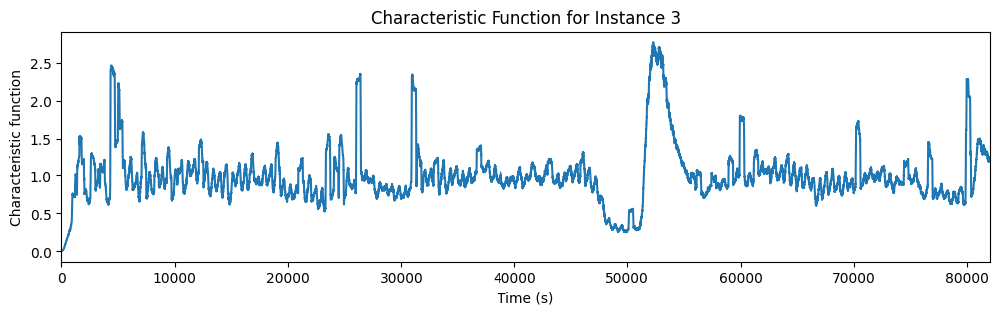

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


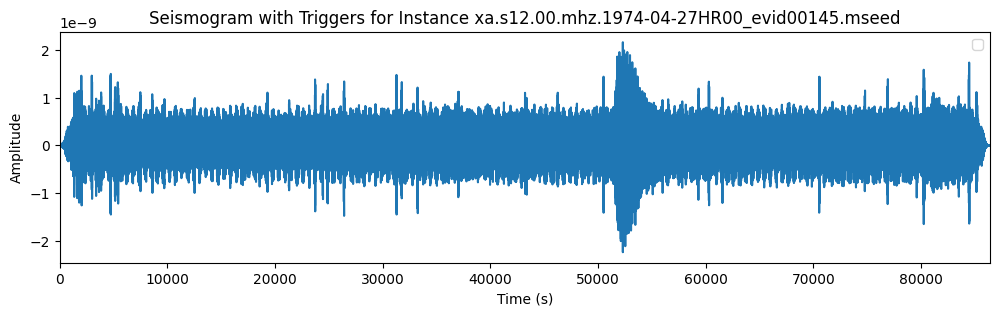

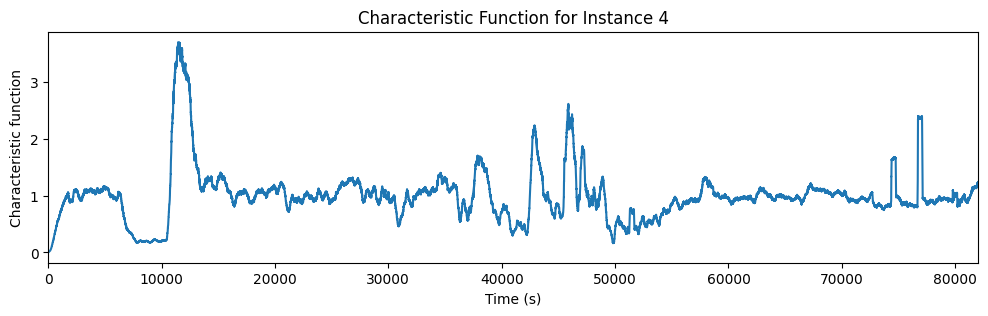

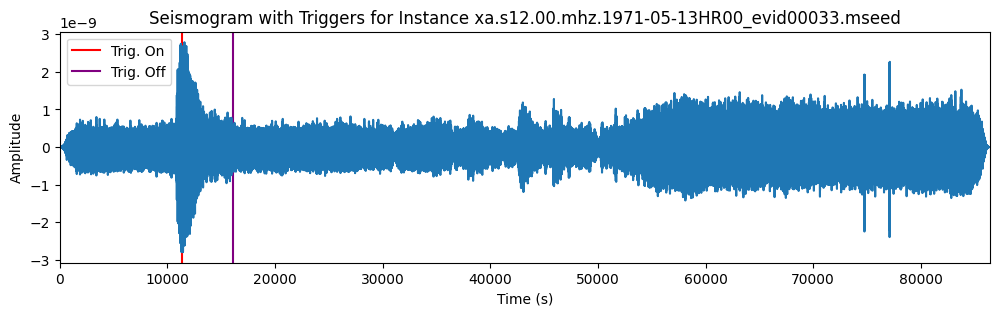

In [32]:
# Parameters for STA/LTA
sta_len = 400  # Short-term window length in seconds
lta_len = 4380  # Long-term window length in seconds

# Counter to limit the number of printed instances
counter = 0
max_instances = 5

# Iterate over each instance in the dataset
for index, row in df_features_labels.iterrows():
    amplitude_data = np.array(row['Amplitude'])  # Extract amplitude data from DataFrame
    filename = row['Filename']  # Extract filename from DataFrame
    
    # Ensure the filename includes the .mseed extension
    if not filename.endswith('.mseed'):
        filename += '.mseed'
    
    # Load the corresponding .mseed file to get the sampling rate
    file_path = os.path.join(data_directory, filename)
    if not os.path.exists(file_path):
        print(f"File not found: {file_path}, skipping instance {index}")
        continue
    
    # Load the corresponding .mseed file to get the sampling rate
    st = read(file_path)

    # Access the first trace in the Stream to get the sampling rate
    trace = st[0]  # st gives the first Trace object in the Stream
    sampling_rate = trace.stats.sampling_rate  # Accessing the sampling rate from the Trace object

    # Calculate the characteristic function
    cft = calculate_sta_lta(amplitude_data, sampling_rate, sta_len, lta_len)
    
    if counter < max_instances:
        # Plot the characteristic function
        fig, ax = plt.subplots(1, 1, figsize=(12, 3))
        ax.plot(np.arange(len(cft)) / sampling_rate, cft)
        ax.set_xlim([0, len(cft) / sampling_rate])
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Characteristic function')
        plt.title(f'Characteristic Function for Instance {index}')
        plt.show()
        
        # Define the values of the characteristic function for triggers
        thr_on = 3.4
        thr_off = 1
        on_off = np.array(trigger_onset(cft, thr_on, thr_off))
        
        # Plot on and off triggers
        fig, ax = plt.subplots(1, 1, figsize=(12, 3))

        # Loop over each trigger (assuming each 'on_off' element has start and end points for a trigger)
        for trigger in on_off:
            # trigger is expected to be an array with two elements: [trigger_on, trigger_off]
            trigger_on, trigger_off = trigger
            
            # Plot the start of the trigger
            ax.axvline(x=trigger_on / sampling_rate, color='red', label='Trig. On')
            
            # Plot the end of the trigger
            ax.axvline(x=trigger_off / sampling_rate, color='purple', label='Trig. Off')

        # Plot seismogram
        ax.plot(np.arange(len(amplitude_data)) / sampling_rate, amplitude_data)
        ax.set_xlim([0, len(amplitude_data) / sampling_rate])
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Amplitude')
        plt.title(f'Seismogram with Triggers for Instance {filename}')
        ax.legend()
        plt.show()
        
        # Increment the counter
        counter += 1

**3.5 Determine the Duration's average of the seismic events manually**

3.5.1 Plot each .MSEED file to see the approx duration

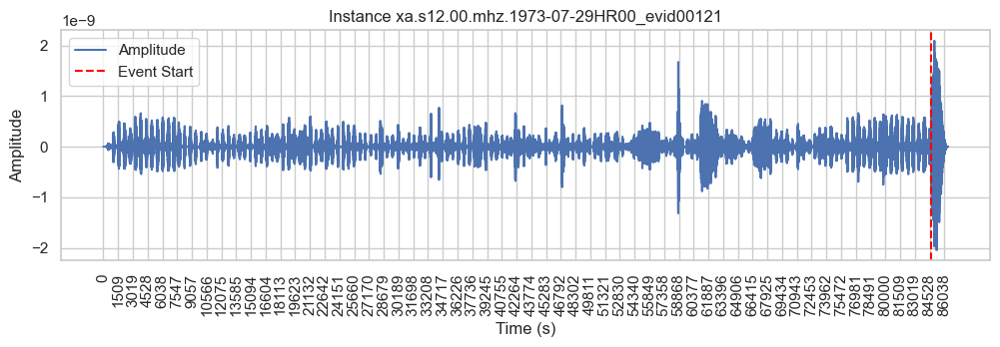

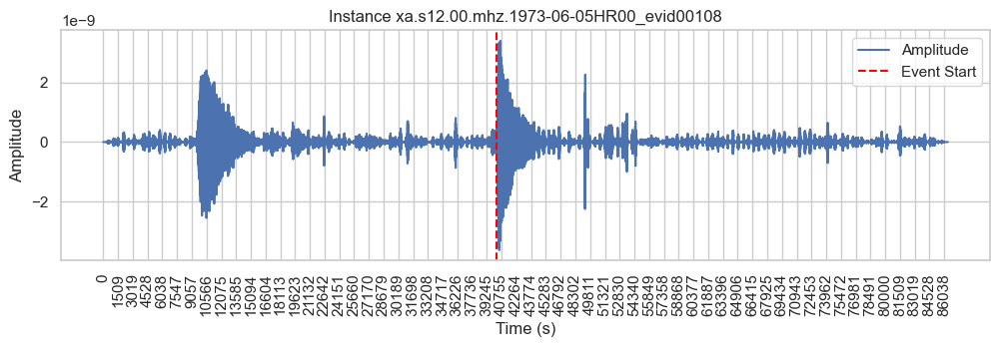

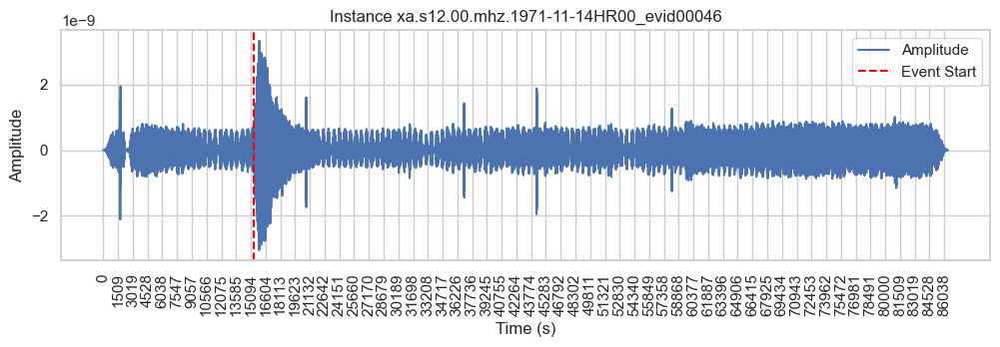

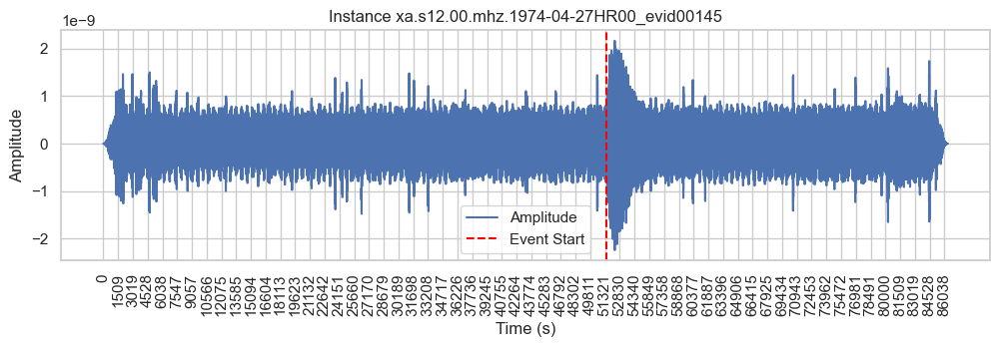

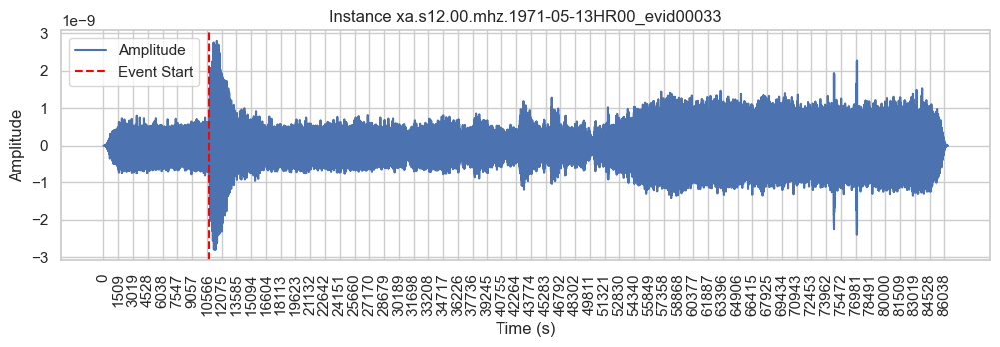

...

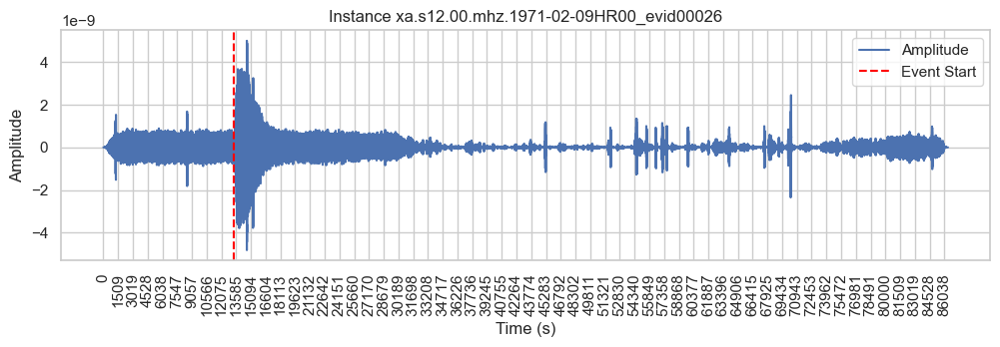

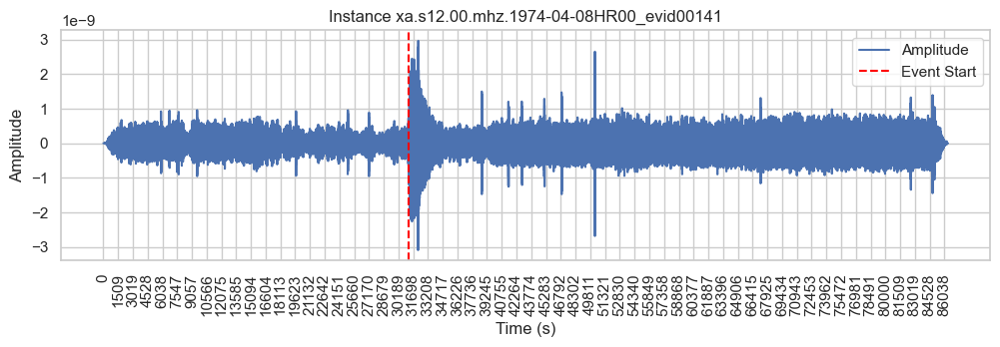

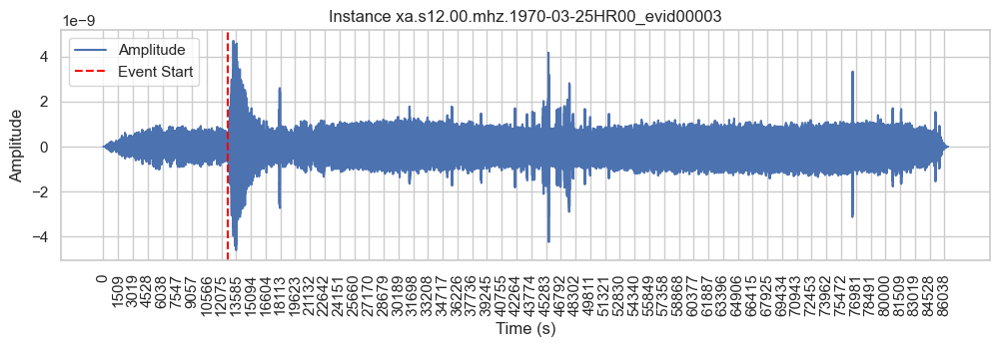

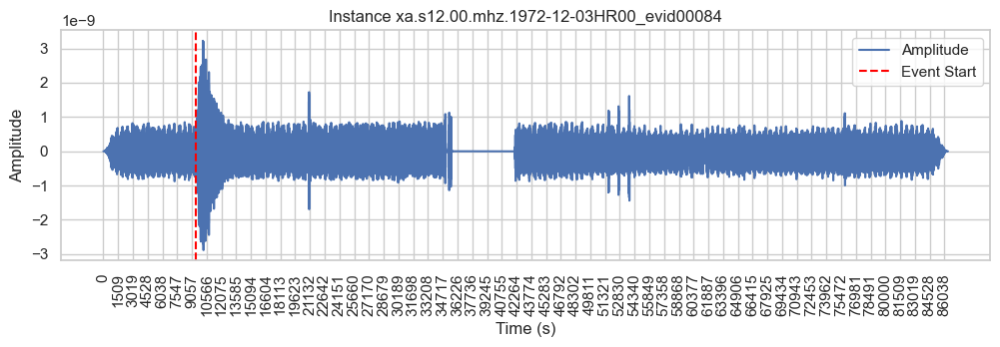

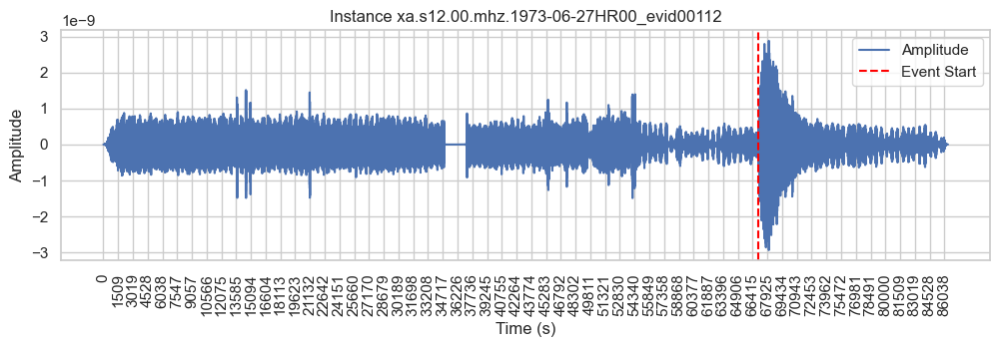

In [62]:
# Visual Analysis: Manually inspect the plots of amplitude data to identify the start of events and the time it takes for the signal to normalize.
def plot_instance(amplitude_data, sampling_rate, time_rel_sec, filename):
    time = np.arange(len(amplitude_data)) / sampling_rate
    plt.figure(figsize=(12, 3))
    plt.plot(time, amplitude_data, label='Amplitude')
    plt.axvline(x=time_rel_sec, color='red', linestyle='--', label='Event Start')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.title(f'Instance {filename}')
    plt.legend()
    
    # Set xticks to have more divisions and rotate labels
    max_time = time[-1]
    plt.xticks(np.arange(0, max_time, step=10000 / sampling_rate), rotation=90)
    
    plt.show()

for index, row in df_features_labels.iterrows():
    amplitude_data = np.array(row['Amplitude'])
    time_rel_sec = row['time_rel(sec)']
    filename = row['Filename']
    plot_instance(amplitude_data, sampling_rate, time_rel_sec, filename)

3.5.2 Calculate Average and 90 percentile

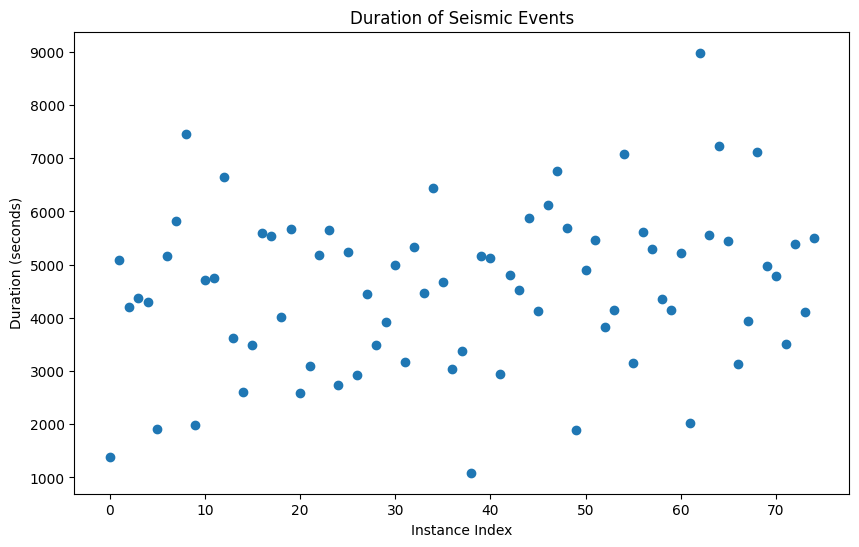

In [34]:
# Plot the Duration
plt.figure(figsize=(10, 6))
plt.plot(df_features_labels['Duration'], 'o')
plt.xlabel('Instance Index')
plt.ylabel('Duration (seconds)')
plt.title('Duration of Seismic Events')
plt.show()

In [35]:
#  Calculate the Average Duration
duration = df_features_labels['Duration'].values
average_duration = df_features_labels['Duration'].mean()
print(f"Average Duration: {average_duration} seconds")

# Using the 90th percentile  to captures a larger portion of the event durations, ensuring that most events are fully included within the segment.
duration_90percentile = np.percentile(duration, 90)
print(f"90th percentile of Duration datapoints: {duration_90percentile}")

Average Duration: 4560.466666666666 seconds
90th percentile of Duration datapoints: 6309.000000000003


**6. Extract seismic and normal/noise data from each file**

In [36]:
# Function to extract seismic and normal/noise data
def extract_data(df, segment_length, num_noise_segments, data_directory, output_file):
    instance_id = 0  # Initialize instance ID
    data_list = []  # List to collect all data

    for index, row in df.iterrows():
        amplitude_data = np.array(row['Amplitude'])
        relative_time_data = np.array(row['Relative Time'])
        filename = row['Filename']
        
        # Ensure the filename includes the .mseed extension
        if not filename.endswith('.mseed'):
            filename += '.mseed'
        
        # Load the corresponding .mseed file to get the sampling rate
        file_path = os.path.join(data_directory, filename)
        if not os.path.exists(file_path):
            print(f"File not found: {file_path}, skipping instance {index}")
            continue
        
        # Load the corresponding .mseed file to get the sampling rate
        st = read(file_path)
        trace = st[0]  # Access the first trace in the Stream to get the sampling rate
        sampling_rate = trace.stats.sampling_rate  # Accessing the sampling rate from the Trace object

        time_rel_start = row['time_rel(sec)']
        
        # Extract seismic data based on fixed segment length
        start_index = int(time_rel_start * sampling_rate)
        end_index = start_index + int(segment_length * sampling_rate)
        seismic_data = amplitude_data[start_index:end_index]
        seismic_time = relative_time_data[start_index:end_index]
        
        # Add seismic data to the list
        data_list.append({
            'ID': instance_id,
            'Filename': row['Filename'],
            'Relative Time': seismic_time,
            'Amplitude': row['Amplitude'],
            'Amplitude Portion': seismic_data,
            'Data Type': 'seismic'
        })
        instance_id += 1
        
        # Extract normal/noise data
        total_length = len(amplitude_data)
        segment_samples = int(segment_length * sampling_rate)
        
        for _ in range(num_noise_segments):
            while True:
                start_noise = random.randint(0, total_length - segment_samples)
                if not (start_index <= start_noise <= end_index or start_index <= start_noise + segment_samples <= end_index):
                    break
            noise_data = amplitude_data[start_noise:start_noise + segment_samples]
            noise_time = relative_time_data[start_noise:start_noise + segment_samples]
            
            # Add noise data to the list
            data_list.append({
                'ID': instance_id,
                'Filename': row['Filename'],
                'Relative Time': noise_time,
                'Amplitude': row['Amplitude'],
                'Amplitude Portion': noise_data,
                'Data Type': 'noise'
            })
            instance_id += 1
    
    # Convert the list to a DataFrame
    df_combined = pd.DataFrame(data_list)
    
    # Save the combined DataFrame to Parquet
    df_combined.to_parquet(output_file, index=False)
    
    print("Data extraction and saving completed.")

In [37]:
# Parameters
segment_length = duration_90percentile  # 90th percentile duration of events in seconds
num_noise_segments = 3  # Number of noise segments to extract per file
data_directory = 'space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA'
output_file = 'df_seismic_and_normal_data.parquet'

# Extract data and save to parquet file
extract_data(df_features_labels, segment_length, num_noise_segments, data_directory, output_file)

Data extraction and saving completed.


In [38]:
# Load the data with the new dataframe(normal/noise and seismic)
df_seismic_normal = pd.read_parquet('df_seismic_and_normal_data.parquet')

In [39]:
# check the new dataset df_seismic_normal_v2.parquet
df_seismic_normal.head(10)

,ID,Filename,Relative Time,Amplitude,Amplitude Portion,Data Type
0,0,xa.s12.00.mhz.1973-07-29HR00_evid00121,"[84659.92452830188, 84660.0754716981, 84660.22...","[-1.145921082898968e-15, -1.4187090358419494e-...","[1.4101474374350336e-11, -1.8792667925173283e-...",seismic
1,1,xa.s12.00.mhz.1973-07-29HR00_evid00121,"[46164.22641509434, 46164.377358490565, 46164....","[-1.145921082898968e-15, -1.4187090358419494e-...","[-1.1958005700385525e-11, -1.1031232298616599e...",noise
2,2,xa.s12.00.mhz.1973-07-29HR00_evid00121,"[69748.37735849056, 69748.52830188679, 69748.6...","[-1.145921082898968e-15, -1.4187090358419494e-...","[-2.025390990138967e-12, -7.174933419976203e-1...",noise
3,3,xa.s12.00.mhz.1973-07-29HR00_evid00121,"[40722.56603773585, 40722.71698113207, 40722.8...","[-1.145921082898968e-15, -1.4187090358419494e-...","[-2.9468450281438776e-14, 2.7521578524268273e-...",noise
4,4,xa.s12.00.mhz.1973-06-05HR00_evid00108,"[40200.0, 40200.15094339623, 40200.30188679245...","[-3.8245369385730925e-16, -4.935499766066096e-...","[1.736880915090966e-11, 4.374744100553767e-11,...",seismic
5,5,xa.s12.00.mhz.1973-06-05HR00_evid00108,"[66957.7358490566, 66957.88679245283, 66958.03...","[-3.8245369385730925e-16, -4.935499766066096e-...","[1.32560627525757e-13, -1.1874193945626733e-12...",noise
6,6,xa.s12.00.mhz.1973-06-05HR00_evid00108,"[51577.66037735849, 51577.811320754714, 51577....","[-3.8245369385730925e-16, -4.935499766066096e-...","[5.5344578129925775e-11, 5.404506303841656e-11...",noise
7,7,xa.s12.00.mhz.1973-06-05HR00_evid00108,"[70639.39622641509, 70639.54716981133, 70639.6...","[-3.8245369385730925e-16, -4.935499766066096e-...","[-1.3403189097141247e-13, -9.294079293905131e-...",noise
8,8,xa.s12.00.mhz.1971-11-14HR00_evid00046,"[15419.924528301886, 15420.075471698112, 15420...","[1.406432122600214e-15, 1.6855208033984058e-15...","[-2.6620933928942953e-11, -2.414125430098778e-...",seismic
9,9,xa.s12.00.mhz.1971-11-14HR00_evid00046,"[7380.075471698113, 7380.226415094339, 7380.37...","[1.406432122600214e-15, 1.6855208033984058e-15...","[-3.0117848511244884e-11, -5.435792861926344e-...",noise


In [40]:
num_instances = df_seismic_normal.shape[0]
print(f"Number of instances: {num_instances}")

Number of instances: 300


In [41]:
# Example code snippet to check lengths of amplitude arrays
for index, row in df_seismic_normal.head(10).iterrows():
    amplitude_values = row['Amplitude']  # Replace with the actual column name containing amplitude data
    print(f"Instance {index}: Length of amplitude data = {len(amplitude_values)}")

Instance 0: Length of amplitude data = 572395
Instance 1: Length of amplitude data = 572395
Instance 2: Length of amplitude data = 572395
Instance 3: Length of amplitude data = 572395
Instance 4: Length of amplitude data = 572395
Instance 5: Length of amplitude data = 572395
Instance 6: Length of amplitude data = 572395
Instance 7: Length of amplitude data = 572395
Instance 8: Length of amplitude data = 572399
Instance 9: Length of amplitude data = 572399


**7. Extract new features from amplitude and metadata**

In [42]:
# 1. Define the sampling rate
delta = 1 / sampling_rate

# 2. Initialize an empty DataFrame to store the features:
df_features = pd.DataFrame()

# 3. Loop through each instance in the DataFrame, calculate features, and save incrementally:
for index, row in df_seismic_normal.iterrows():
    amplitude_data = np.array(row['Amplitude Portion'])
    
    # Calculate features
    velocity = np.gradient(amplitude_data, delta)
    acceleration = np.gradient(velocity, delta)
    zcr = ((amplitude_data[:-1] * amplitude_data[1:]) < 0).sum()
    energy = np.sum(amplitude_data**2)
    pga = np.max(np.abs(acceleration))
    pgv = np.max(np.abs(velocity))
    pgd = np.max(np.abs(amplitude_data))
    freqs = np.fft.rfftfreq(len(amplitude_data), d=delta)
    fft_values = np.abs(np.fft.rfft(amplitude_data))
    dominant_frequency = freqs[np.argmax(fft_values)]
    noise_level = np.mean(amplitude_data)
    snr = np.max(amplitude_data) / noise_level if noise_level != 0 else np.nan
    cav = np.sum(np.abs(velocity)) * delta
    rms_amplitude = np.sqrt(np.mean(amplitude_data**2))

    # Create a DataFrame for the current instance
    df_instance = pd.DataFrame({
        'ID': [index],
        'Filename': [row['Filename']],
        'Relative Time': [row['Relative Time']],
        'Amplitude Portion': [row['Amplitude Portion']],
        'Velocity': [velocity.tolist()],
        'Acceleration': [acceleration.tolist()],
        'ZCR': [zcr],
        'Energy': [energy],
        'PGA': [pga],
        'PGV': [pgv],
        'PGD': [pgd],
        'Dominant Frequency': [dominant_frequency],
        'SNR': [snr],
        'CAV': [cav],
        'RMS Amplitude': [rms_amplitude],
        'Data Type': [row['Data Type']]
    })

    # Append the instance DataFrame to the main DataFrame
    df_features = pd.concat([df_features, df_instance], ignore_index=True)

    # Save the DataFrame incrementally to avoid memory issues
    df_features.to_parquet('df_seismic_and_normal_data_with_newfeatures.parquet', index=False)

In [43]:
# Load the data with the new dataframe with extracted features from amplitud and metadata
df_extracted_features = pd.read_parquet('df_seismic_and_normal_data_with_newfeatures.parquet')

# check the new dataset df_seismic_normal_v2.parquet
df_extracted_features.head()

,ID,Filename,Relative Time,Amplitude Portion,Velocity,Acceleration,ZCR,Energy,PGA,PGV,PGD,Dominant Frequency,SNR,CAV,RMS Amplitude,Data Type
0,0,xa.s12.00.mhz.1973-07-29HR00_evid00121,"[84659.92452830188, 84660.0754716981, 84660.22...","[1.4101474374350336e-11, -1.8792667925173283e-...","[-2.17923692734344e-10, -1.9375817843914813e-1...","[1.6009653220567273e-10, 4.775961109713672e-10...",2779,1.769885e-15,4.820592e-08,1.004188e-08,2.092274e-09,0.910125,-6401.633331,2.019815e-06,3.919130e-10,seismic
1,1,xa.s12.00.mhz.1973-07-29HR00_evid00121,"[46164.22641509434, 46164.377358490565, 46164....","[-1.1958005700385525e-11, -1.1031232298616599e...","[6.139873786719136e-12, 1.798211453719128e-11,...","[7.845484497187795e-11, 6.762341862505752e-11,...",6490,1.883750e-16,1.277479e-08,3.808658e-09,8.152332e-10,0.110636,-498.080273,5.283710e-07,6.713347e-11,noise
2,2,xa.s12.00.mhz.1973-07-29HR00_evid00121,"[69748.37735849056, 69748.52830188679, 69748.6...","[-2.025390990138967e-12, -7.174933419976203e-1...","[-4.619211237637527e-10, -3.825941202901734e-1...","[5.255413980124631e-10, 1.1161614280934661e-09...",7340,1.552035e-16,1.006451e-08,2.133874e-09,4.521304e-10,0.828184,-1771.478594,7.885562e-07,6.093660e-11,noise
3,3,xa.s12.00.mhz.1973-07-29HR00_evid00121,"[40722.56603773585, 40722.71698113207, 40722.8...","[-2.9468450281438776e-14, 2.7521578524268273e-...","[3.7755894083780923e-13, 1.9394068227665695e-1...","[-1.2164709629676338e-12, -1.6297397335311052e...",6608,2.202996e-16,1.287330e-08,3.836941e-09,8.152332e-10,0.106673,1496.388159,5.565772e-07,7.259961e-11,noise
4,4,xa.s12.00.mhz.1973-06-05HR00_evid00108,"[40200.0, 40200.15094339623, 40200.30188679245...","[1.736880915090966e-11, 4.374744100553767e-11,...","[1.7475843603691058e-10, 1.1180849230019037e-1...","[-4.1704337725577145e-10, -6.981649690284774e-...",8622,7.627977e-15,7.512428e-08,1.548455e-08,3.642109e-09,0.828184,32044.664751,6.344834e-06,4.272009e-10,seismic


**9.  Data Analysis using the correlation matrix**

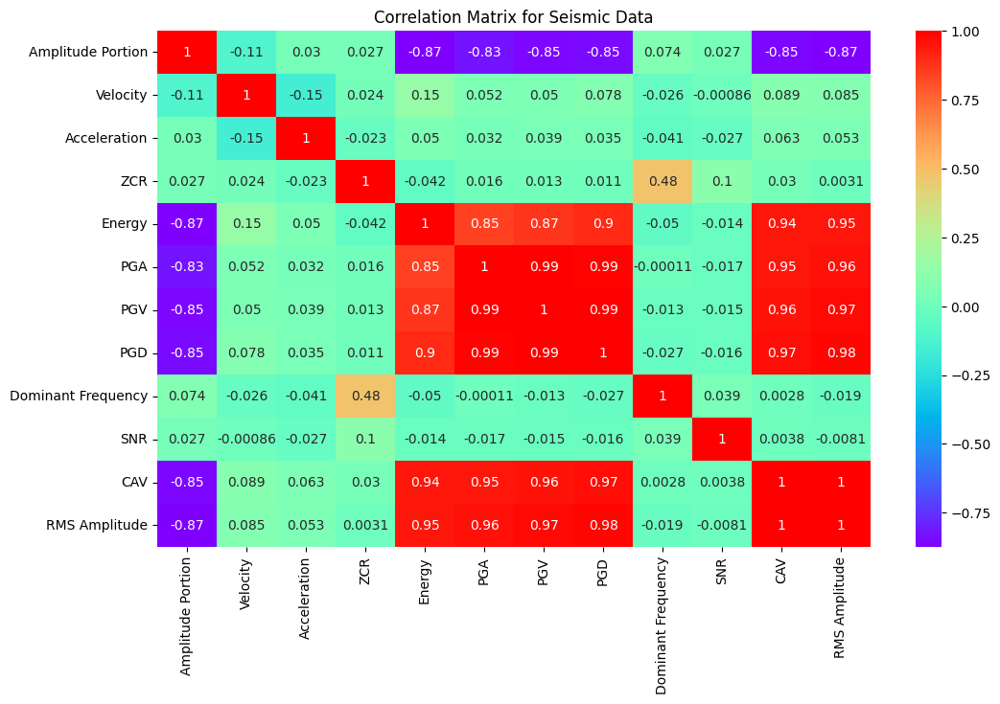

In [44]:
# Print the correlation matrix for all the features:

# 1. Convert list columns to their mean values
df_extracted_features['Amplitude Portion'] = df_extracted_features['Amplitude Portion'].apply(lambda x: np.mean(x))
df_extracted_features['Velocity'] = df_extracted_features['Velocity'].apply(lambda x: np.mean(x))
df_extracted_features['Acceleration'] = df_extracted_features['Acceleration'].apply(lambda x: np.mean(x))

# 2. Select relevant numerical columns for correlation analysis
correlation_matrix = df_extracted_features[['Amplitude Portion', 'Velocity', 'Acceleration', 'ZCR', 'Energy', 'PGA', 'PGV', 'PGD', 'Dominant Frequency', 'SNR', 'CAV', 'RMS Amplitude']].corr()

# 3. Plot the correlation matrix using Seaborn's heatmap
plt.figure(figsize=(12, 7))
sns.heatmap(correlation_matrix, annot=True, cmap='rainbow', cbar=True)
plt.title('Correlation Matrix for Seismic Data')
plt.show()

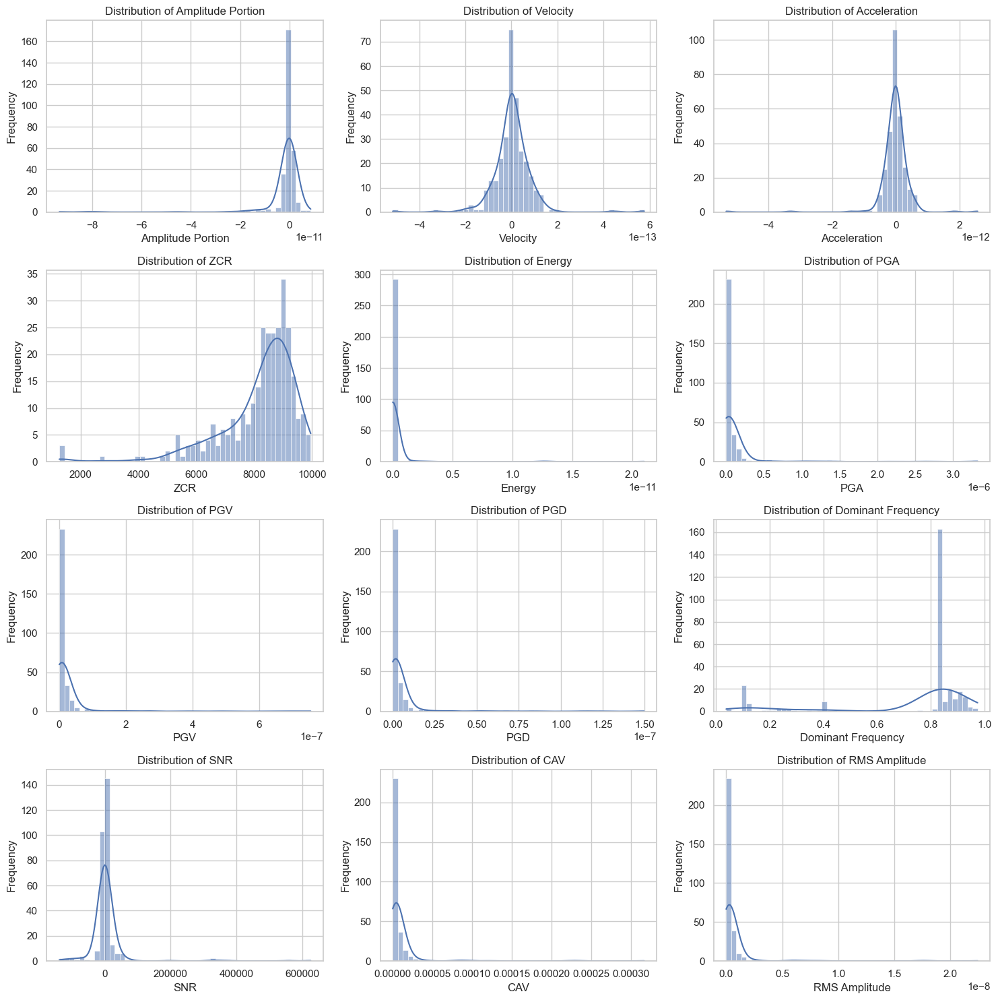

In [45]:
# # print out the distribution of each feature extracted as a histogram

# Set the style of seaborn
sns.set(style="whitegrid")

# Create a figure and a set of subplots
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 15))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# List of features to plot
features = ['Amplitude Portion', 'Velocity', 'Acceleration', 'ZCR', 'Energy', 'PGA', 'PGV', 'PGD', 'Dominant Frequency', 'SNR', 'CAV', 'RMS Amplitude']

# Plot each feature in a separate subplot
for i, feature in enumerate(features):
    sns.histplot(df_extracted_features[feature], bins=50, kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {feature}')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Frequency')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

**10. Create a new dataset for features that contains a single value from the original dataset.**

In [46]:
# Create the dataset for single-value features
df_features_single_value = df_extracted_features[['ZCR', 'Energy', 'PGA', 'PGV', 'PGD', 'Dominant Frequency', 'SNR', 'CAV', 'RMS Amplitude', 'Data Type']]

print("\nSingle-value features dataset:")
print(df_features_single_value.head(1))


Single-value features dataset:
    ZCR        Energy           PGA           PGV           PGD  \
0  2779  1.769885e-15  4.820592e-08  1.004188e-08  2.092274e-09   

   Dominant Frequency          SNR       CAV  RMS Amplitude Data Type  
0            0.910125 -6401.633331  0.000002   3.919130e-10   seismic  


**11. Separate the features and target variable for each dataset**

In [47]:
# Separate features (X) and target variable (y)
X_features_single_value = df_features_single_value.drop('Data Type', axis=1)
y = df_features_single_value['Data Type']

In [48]:
# 11.1 Perform stratified split for training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_features_single_value, y, test_size=0.2, stratify=y, random_state=42)

In [49]:
# 11.2 alance the Training Data
smote = SMOTE(random_state=42) # Initialize the SMOTE oversampler

# Balance the training data
X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)

print("Balanced training data shape:", X_train_balanced.shape)
print("Balanced training labels distribution:\n", pd.Series(y_train_balanced).value_counts())

Balanced training data shape: (360, 9)
Balanced training labels distribution:
 Data Type
noise      180
seismic    180
Name: count, dtype: int64


In [50]:
# 11.3 Normalize the single value features
standard_scaler = StandardScaler()
X_train_scaled = standard_scaler.fit_transform(X_train)
X_test_scaled = standard_scaler.transform(X_test)

# After fitting on training data
joblib.dump(standard_scaler, 'standard_scaler.pkl')

['standard_scaler.pkl']

In [51]:
# 11.4 Apply Kernel PCA on the scaled features
kernel_pca = KernelPCA(n_components=2, kernel='linear')
X_train_kpca = kernel_pca.fit_transform(X_train_scaled)
X_test_kpca = kernel_pca.transform(X_test_scaled)

# Save the fitted Kernel PCA model
joblib.dump(kernel_pca, 'kernel_pca_model.pkl')

['kernel_pca_model.pkl']

**12. Train the Supervisel Model**

In [52]:
# 12.1 # Initialize the SVM model
svm_model = SVC(kernel='rbf', C=1.0, gamma='scale', random_state=42)

In [53]:
# 12.2 Train the SVM model on the training data
svm_model.fit(X_train_kpca, y_train)

SVC(random_state=42)

**13. Make Predictions and Evaluate the Model**

In [54]:
# 13.1 # Make predictions on the test data
y_pred = svm_model.predict(X_test_kpca)

In [55]:
# 3.2 # Evaluate the model's performance
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("Accuracy Score:", accuracy_score(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

       noise       0.90      1.00      0.95        45
     seismic       1.00      0.67      0.80        15

    accuracy                           0.92        60
   macro avg       0.95      0.83      0.87        60
weighted avg       0.93      0.92      0.91        60

Confusion Matrix:
 [[45  0]
 [ 5 10]]
Accuracy Score: 0.9166666666666666


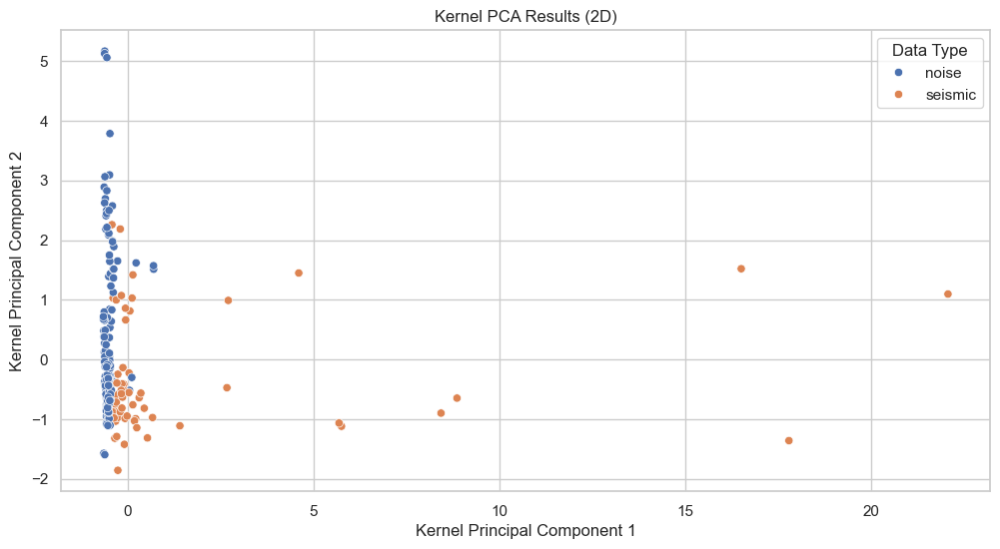

In [56]:
# Plot the first two Kernel Principal Components
plt.figure(figsize=(12, 6))
sns.scatterplot(x=X_train_kpca[:, 0], y=X_train_kpca[:, 1], hue=y_train)
plt.title('Kernel PCA Results (2D)')
plt.xlabel('Kernel Principal Component 1')
plt.ylabel('Kernel Principal Component 2')
plt.show()

**14. Fine-Tuning the SVM using GridSearchCV**

In [57]:
# 14.1 Set up the Parameter Grid for Grid Search:

# Define the parameter grid for SVM
param_grid = {
    'C': [0.01, 0.1, 1, 10, 50, 100, 200, 500, 1000, 5000, 10000],  
    'gamma': ['scale', 'auto', 0.01, 0.001, 0.0001, 1e-5, 1e-6],  
    'kernel': ['rbf', 'poly', 'linear', 'sigmoid'], 
    'degree': [2, 3, 4, 5, 6],  
    'coef0': [0.0, 0.1, 0.5, 1.0]  
}

# Create a Support Vector Classifier (SVC)
svc = SVC()

# Initialize GridSearchCV with the SVC model and parameter grid
grid_search = GridSearchCV(estimator=svc, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)

In [58]:
# 14.2 Perform Grid Search with Cross-Validation:

# Fit GridSearchCV on the training data
grid_search.fit(X_train_kpca, y_train)

# Get the best parameters and the best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Best parameters found by GridSearchCV:", best_params)
print("Best cross-validation score:", best_score)

Fitting 5 folds for each of 6160 candidates, totalling 30800 fits
[CV] END C=0.01, coef0=0.0, degree=2, gamma=scale, kernel=rbf; total time=   0.0s
[CV] END C=0.01, coef0=0.0, degree=2, gamma=scale, kernel=poly; total time=   0.0s
[CV] END C=0.01, coef0=0.0, degree=2, gamma=scale, kernel=rbf; total time=   0.0s
[CV] END C=0.01, coef0=0.0, degree=2, gamma=scale, kernel=rbf; total time=   0.0s
[CV] END C=0.01, coef0=0.0, degree=2, gamma=scale, kernel=rbf; total time=   0.0s
[CV] END C=0.01, coef0=0.0, degree=2, gamma=scale, kernel=poly; total time=   0.0s
[CV] END C=0.01, coef0=0.0, degree=2, gamma=scale, kernel=poly; total time=   0.0s
[CV] END C=0.01, coef0=0.0, degree=2, gamma=scale, kernel=rbf; total time=   0.0s
[CV] END C=0.01, coef0=0.0, degree=2, gamma=scale, kernel=poly; total time=   0.0s
[CV] END C=0.01, coef0=0.0, degree=2, gamma=scale, kernel=poly; total time=   0.0s
[CV] END C=0.01, coef0=0.0, degree=2, gamma=scale, kernel=linear; total time=   0.0s
[CV] END C=0.01, coef0=0

In [59]:
# 14.3 Train the SVM with the Best Parameters

# Train the SVM using the best parameters found from GridSearchCV
best_svm = SVC(C=best_params['C'], gamma=best_params['gamma'], kernel=best_params['kernel'])
best_svm.fit(X_train_kpca, y_train)

# Save the model after training
joblib.dump(svm_model, 'svm_model.pkl')

['svm_model.pkl']

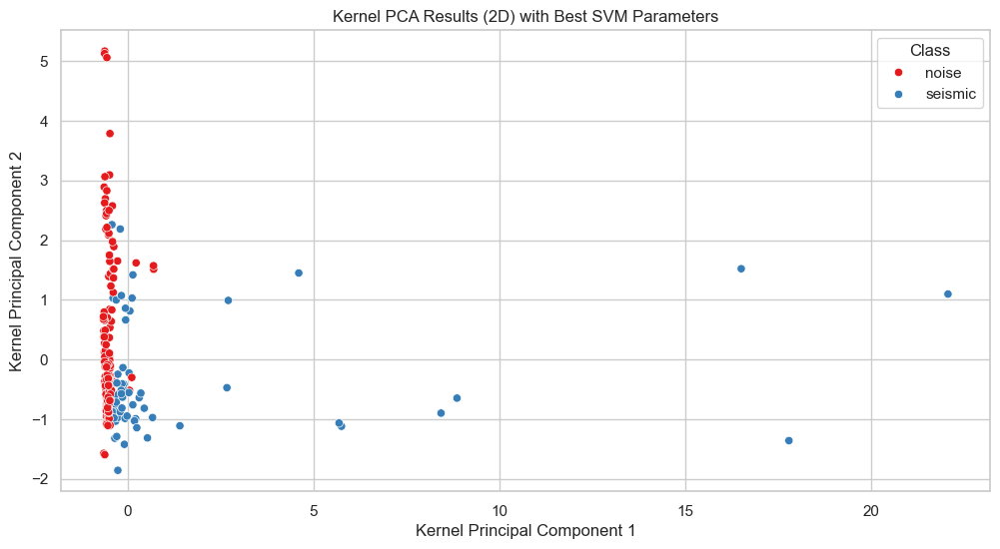

In [60]:
# 5.4 Plot the Kernel PCA Components Using the Best Model

plt.figure(figsize=(12, 6))
sns.scatterplot(x=X_train_kpca[:, 0], y=X_train_kpca[:, 1], hue=y_train, palette='Set1')
plt.title('Kernel PCA Results (2D) with Best SVM Parameters')
plt.xlabel('Kernel Principal Component 1')
plt.ylabel('Kernel Principal Component 2')
plt.legend(title='Class')
plt.show()

# PIPELINE

**14. Final Implementation of the Seismic Detection Model using STA/LTA as detector and SVM Model as classifier of the data**

In [61]:
class STA_LTA_Detector:
    def __init__(self, sta_len, lta_len, thr_on, thr_off, event_duration, svm_model, standard_scaler, kernel_pca):
        self.sta_len = sta_len
        self.lta_len = lta_len
        self.thr_on = thr_on
        self.thr_off = thr_off
        self.event_duration = event_duration
        self.svm_model = svm_model
        self.standard_scaler = standard_scaler
        self.kernel_pca = kernel_pca

    def calculate_sta_lta(self, amplitude_data, sampling_rate):
        sta_samples = int(self.sta_len * sampling_rate)
        lta_samples = int(self.lta_len * sampling_rate)
        
        sta = np.cumsum(amplitude_data ** 2)
        sta = np.insert(sta, 0, 0)
        sta = (sta[sta_samples:] - sta[:-sta_samples]) / sta_samples

        lta = np.cumsum(amplitude_data ** 2)
        lta = np.insert(lta, 0, 0)
        lta = (lta[lta_samples:] - lta[:-lta_samples]) / lta_samples
        
        min_len = min(len(sta), len(lta))
        sta = sta[:min_len]
        lta = lta[:min_len]
        lta[lta == 0] = np.nan
        cft = sta / lta
        cft = np.nan_to_num(cft)
        return cft

    def detect_events(self, cft):
        above_threshold = cft > self.thr_on
        below_threshold = cft < self.thr_off

        onsets = np.where(np.diff(above_threshold.astype(int)) == 1)[0]
        offsets = np.where(np.diff(below_threshold.astype(int)) == -1)[0]

        return list(zip(onsets, offsets))

    def extract_features(self, amplitude_data, sampling_rate):
        delta = 1 / sampling_rate
        velocity = np.gradient(amplitude_data, delta)
        acceleration = np.gradient(velocity, delta)
        zcr = ((amplitude_data[:-1] * amplitude_data[1:]) < 0).sum()
        energy = np.sum(amplitude_data**2)
        pga = np.max(np.abs(acceleration))
        pgv = np.max(np.abs(velocity))
        pgd = np.max(np.abs(amplitude_data))
        freqs = np.fft.rfftfreq(len(amplitude_data), d=delta)
        fft_values = np.abs(np.fft.rfft(amplitude_data))
        dominant_frequency = freqs[np.argmax(fft_values)]
        noise_level = np.mean(amplitude_data)
        snr = np.max(amplitude_data) / noise_level if noise_level != 0 else np.nan
        cav = np.sum(np.abs(velocity)) * delta
        rms_amplitude = np.sqrt(np.mean(amplitude_data**2))

        features = np.array([zcr, energy, pga, pgv, pgd, dominant_frequency, snr, cav, rms_amplitude])
        return features

    def process_event(self, amplitude_data, sampling_rate, trace, test_file):
        cft = self.calculate_sta_lta(amplitude_data, sampling_rate)
        on_off = self.detect_events(cft)

        detection_times = []
        fnames = []
        tr_times = []

        # Debug: Check detected events
        print("Detected Events:", on_off)

        for start, _ in on_off:
            end_index = start + int(self.event_duration * sampling_rate)
            if end_index > len(amplitude_data):
                end_index = len(amplitude_data)

            event_data = amplitude_data[start:end_index]
            features = self.extract_features(event_data, sampling_rate)

            # Scale and transform features for the SVM model
            features_df = pd.DataFrame(features.reshape(1, -1), columns=['ZCR', 'Energy', 'PGA', 'PGV', 'PGD', 'Dominant Frequency', 'SNR', 'CAV', 'RMS Amplitude'])
            features_scaled = self.standard_scaler.transform(features_df)
            features_kpca = self.kernel_pca.transform(features_scaled)
            prediction = self.svm_model.predict(features_kpca)

            if prediction == 1:
                on_time = trace.stats.starttime + timedelta(seconds=start / sampling_rate)
                on_time_str = datetime.strftime(on_time, '%Y-%m-%dT%H:%M:%S.%f')
                detection_times.append(on_time_str)
                fnames.append(test_file)
                tr_times.append(start / sampling_rate)

        return detection_times, fnames, tr_times

# Parameters for STA/LTA
sta_len = 400  # Example value
lta_len = 4380  # Example value
thr_on = 3.4  # Threshold for trigger on
thr_off = 1  # Threshold for trigger off
event_duration = 4561.466666  # Duration in seconds

# Load the pre-trained SVM model, standard scaler, and kernel PCA
svm_model = joblib.load('svm_model.pkl')
standard_scaler = joblib.load('standard_scaler.pkl')
kernel_pca = joblib.load('kernel_pca_model.pkl')

# Initialize the STA/LTA detector
sta_lta_detector = STA_LTA_Detector(sta_len, lta_len, thr_on, thr_off, event_duration, svm_model, standard_scaler, kernel_pca)

# Load test data
test_data_directory = './space_apps_2024_seismic_detection/data/lunar/test/data'

# Initialize lists to store results
all_detection_times = []
all_fnames = []
all_tr_times = []

# Recursively find all .mseed files in the directory
for root, dirs, files in os.walk(test_data_directory):
    for file in files:
        if file.endswith('.mseed'):
            file_path = os.path.join(root, file)
            st = read(file_path)
            trace = st[0]  # Access the first Trace object in the Stream
            sampling_rate = trace.stats.sampling_rate
            amplitude_data = trace.data

            # Process the event
            detection_times, fnames, tr_times = sta_lta_detector.process_event(amplitude_data, sampling_rate, trace, file)

            # Append results
            all_detection_times.extend(detection_times)
            all_fnames.extend(fnames)
            all_tr_times.extend(tr_times)

# Compile DataFrame of detections
detect_df = pd.DataFrame(data={
    'filename': all_fnames,
    'time_abs(%Y-%m-%dT%H:%M:%S.%f)': all_detection_times,
    'time_rel(sec)': all_tr_times
})

print(detect_df.head())

# Save the results to a CSV file
detect_df.to_csv('predictions.csv', index=False)

Detected Events: [(113859, 7270), (113862, 11409), (113891, 22712), (113958, 33308), (123809, 35924), (125192, 35941), (125444, 36427), (206074, 48848), (279565, 52090), (362545, 110012), (387151, 164838), (424198, 165617), (452945, 169968), (487631, 173932)]
Detected Events: [(9135, 8851), (31946, 17761), (45965, 23016), (53358, 28975), (86636, 44731), (86829, 53148), (86833, 59903), (95124, 65043), (97452, 80713), (97653, 100888), (116841, 106520), (323521, 112540), (323523, 116242), (323672, 152679), (323674, 165181)]
Detected Events: [(53548, 8589), (53736, 36823), (59630, 36872), (63713, 37016), (307427, 37058), (339710, 37076), (357318, 37079), (362905, 37471), (403831, 56611), (442089, 56896), (442430, 56918)]
Detected Events: [(299977, 10191), (492649, 15189), (492659, 15623), (492662, 17241), (492683, 19839), (492709, 19850), (492717, 27132), (493294, 27159), (493326, 27216), (493345, 27241), (494386, 29186)]
Detected Events: [(19426, 1909), (184278, 7974), (184294, 7986), (18